In [564]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pygmt
import xarray as xr
import rasterio
import os



**Method**

Provided Insar data for ascending and descending tracks this data provides line of sight (LoS) velocity . Data dimensions and variables can be seen below. 

This note book is used to show deformation of different physical processes in the krafla area in iceland. 
First we tried to isolate the plate spreading velocity, by decomposing the LoS in reference with the direction of plate spreading (assuming that the velocity paralel to the plates is zero and there for your left with the vertical component and the direction perpendicular to the plates). 

This could then be subtracted from total signal to visualise the other physical processes in the area causing deformation. The Kralfa area has activive volcanism, geothermal activity and there is uplift because of the loss of glaciers.

In [4]:
data_T045_asc = xr.open_dataset('T045_asc_2018_2022.nc')
data_T111_dec = xr.open_dataset('T111_dsc_2018_2022.nc')

In [5]:
data_T045_asc

<xarray.Dataset>
Dimensions:               (index: 1000000)
Coordinates:
  * index                 (index) int32 5237712 8964878 ... 7414999 38290
Data variables: (12/89)
    pid                   (index) object ...
    mp_type               (index) int32 ...
    latitude              (index) float64 ...
    longitude             (index) float64 ...
    easting               (index) float64 ...
    northing              (index) float64 ...
    ...                    ...
    20220827              (index) float64 ...
    20220908              (index) float64 ...
    20220920              (index) float64 ...
    20221002              (index) float64 ...
    20221014              (index) float64 ...
    20221026              (index) float64 ...

In [689]:
data_T111_dec

<xarray.Dataset>
Dimensions:               (index: 1000000)
Coordinates:
  * index                 (index) int32 654945 9666696 ... 10800349 103576
Data variables: (12/140)
    pid                   (index) object ...
    mp_type               (index) int32 ...
    latitude              (index) float64 ...
    longitude             (index) float64 ...
    easting               (index) float64 ...
    northing              (index) float64 ...
    ...                    ...
    20220901              (index) float64 ...
    20220913              (index) float64 ...
    20220925              (index) float64 ...
    20221007              (index) float64 ...
    20221019              (index) float64 ...
    20221031              (index) float64 ...

In [971]:
#get the needed variables from the data and make a dataframe

def process_track_data(data_track):
    """
    Process track data to combine relevant information into a single DataFrame.
    
    Parameters:
    data_track (xarray.Dataset): The track data (ascending or descending).
    
    Returns:
    pd.DataFrame: Combined DataFrame with latitude, longitude, mean_velocity, 
                  amplitude_dispersion, and date-specific variables.
    """
    # Extract the variables
    latitude = data_track['latitude']
    longitude = data_track['longitude']
    mean_velocity = data_track['mean_velocity']
    amplitude_dispersion = data_track['amplitude_dispersion']
    incidence_angle = data_track['incidence_angle']
    track_angle = data_track['track_angle']
    temporal_coherence = data_track['temporal_coherence']



    # Convert latitude, longitude, mean_velocity, and amplitude_dispersion to DataFrames
    df_latitude = latitude.to_dataframe().reset_index()
    df_longitude = longitude.to_dataframe().reset_index()
    df_mean_velocity = mean_velocity.to_dataframe().reset_index()
    df_amplitude_dispersion = amplitude_dispersion.to_dataframe().reset_index()
    df_incidence_angle = incidence_angle.to_dataframe().reset_index()
    df_track_angle = track_angle.to_dataframe().reset_index()
    df_temporal_coherence = temporal_coherence.to_dataframe().reset_index()


    # Merge all DataFrames on their common dimensions (index)
    df_combined = df_mean_velocity.merge(df_latitude, on='index') \
                                  .merge(df_longitude, on='index') \
                                  .merge(df_amplitude_dispersion, on='index') \
                                    .merge(df_temporal_coherence, on='index')\
                                    .merge(df_incidence_angle, on='index')\
                                    .merge(df_track_angle, on='index')\
                                


    return df_combined

# Example usage:
df_combined_asc = process_track_data(data_T045_asc)
df_combined_dec = process_track_data(data_T111_dec)


In [989]:
# Filter the combined DataFrame based on amplitude dispersion

 def filter_data(data, dispersion_threshold=0.35):
   filtered_combined_df = data[data['amplitude_dispersion'] < dispersion_threshold]
   return filtered_combined_df

# Example usage:
filtered_df_asc = filter_data(df_combined_asc)
filtered_df_dec = filter_data(df_combined_dec)

In [990]:
#dropping index
filtered_df_asc = filtered_df_asc.drop(columns=['index'])
filtered_df_dec = filtered_df_dec.drop(columns=['index'])

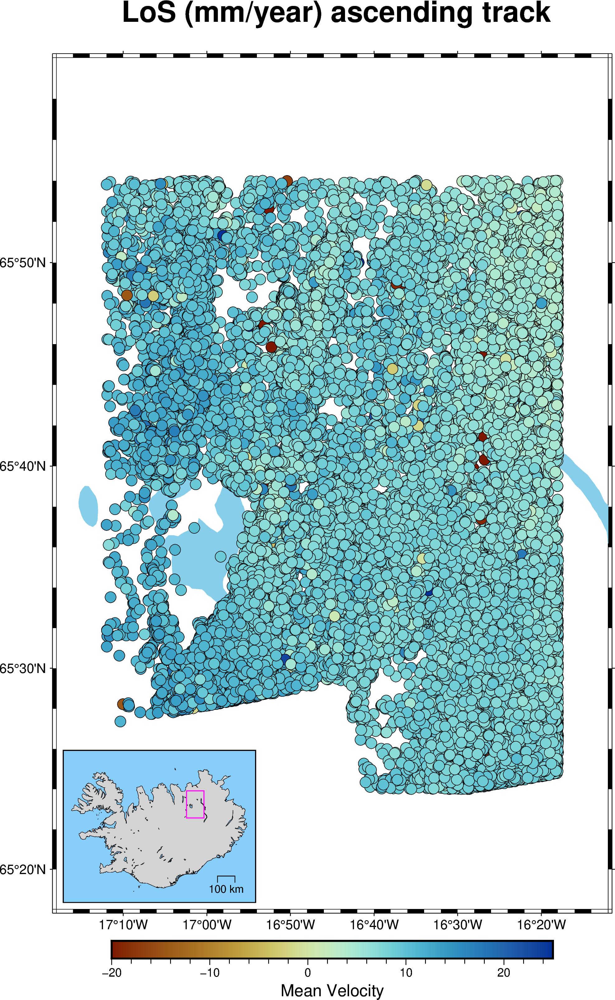

In [999]:
#plotting ascending track scatter points (filtered on amplitude dispersion)

lonmin = filtered_df_asc['longitude'].min()-0.1
lonmax = filtered_df_asc['longitude'].max()+0.1
latmin = filtered_df_asc['latitude'].min()-0.1
latmax = filtered_df_asc['latitude'].max()+0.1
region= [lonmin,  lonmax, latmin, latmax]



fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(shorelines="1/0.5p,black", water="skyblue")
pygmt.makecpt(cmap="roma", series=[-20, 25])

fig.plot(x= filtered_df_asc['longitude'],y= filtered_df_asc['latitude'], cmap=True, style="c0.3c", fill=filtered_df_asc['mean_velocity'], pen="black", frame= "+t LoS (mm/year) ascending track")
fig.colorbar(frame="xaf+lMean Velocity")


# Make the inset, indicating the region of interest, with all of its features
with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
    fig.coast(
        region="-25/-13/63/67",
        projection="M?", borders=[1, 2],
        land="lightgray", water="lightskyblue",
        shorelines="0.2p,black", map_scale="n0.85/0.15+l+c127.7/34.95+w100"
    )

    rectangle = [[region[0], region[2], region[1], region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

fig.savefig("presentation/los_ascending_points.png")
fig.show()



blockmean [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
blockmean [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
blockmean (gmtapi_init_grdheader): Please select compatible -R and -I values
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/3720471075.py:39: SyntaxWarning: Short-form parameter (T) is not recommended. Use long-form parameter 'tension' instead.
  surface_grid = pygmt.surface(
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an i

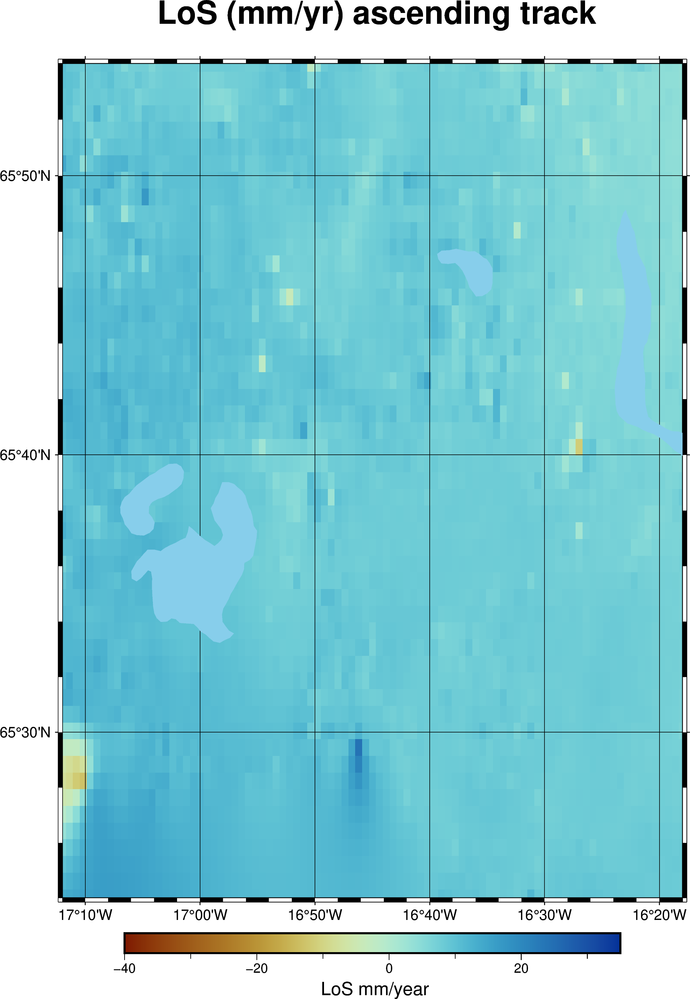

In [1141]:
#plotting ascending track grid (filtered on amplitude dispersion)
fig = pygmt.Figure()
fig.set_panel(panel=[1, 1], figsize=(8, 6))

region = [
    filtered_df_asc['longitude'].min(),
    filtered_df_asc['longitude'].max() ,
    filtered_df_asc['latitude'].min() ,
    filtered_df_asc['latitude'].max()
]

# Create a temporary DataFrame to use with PyGMT blockmean and surface
temp_df = filtered_df_asc[['longitude', 'latitude', 'mean_velocity']]


# Create a blockmean grid
blockmean_output = pygmt.blockmean(
    data=temp_df,
    region=region,
    spacing="0.01"
)

# Create a surface grid
surface_grid = pygmt.surface(
    data=blockmean_output,
    region=region,
    spacing="0.01",
    T=0.25  # Adjust Tension factor for smoother grid
)

# Start plotting
fig = pygmt.Figure()
fig.set_panel(panel=[1, 1], figsize=(8, 6))
# Set the color palette
pygmt.makecpt(cmap="roma", series=[-40, 35])

# Plot the surface grid
fig.grdimage(
    grid=surface_grid,
    region=region,
    projection="M15c",
    frame=["afg", "+t LoS (mm/yr) ascending track"],
    cmap=True
)

# Add coastlines
fig.coast(
    shorelines="1/0.5p,black",
    water="skyblue"
)

# Add colorbar
fig.colorbar(frame="xaf+l LoS mm/year")

# # Create the inset
# with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
#     fig.coast(
#         region="-25/-13/63/67",
#         projection="M?",
#         borders=[1, 2],
#         land="lightgray",
#         water="lightskyblue",
#         shorelines="0.2p,black",
#         map_scale="n0.85/0.15+l+c127.7/34.95+w100"
#     )
#     rectangle = [[region[0], region[2], region[1], region[3]]]
#     fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Ensure the "presentation" folder exists
os.makedirs("presentation", exist_ok=True)

# Save the figure in the "presentation" folder
fig.savefig("presentation/los_ascending_grid1.png")
# Show the figure
fig.show()

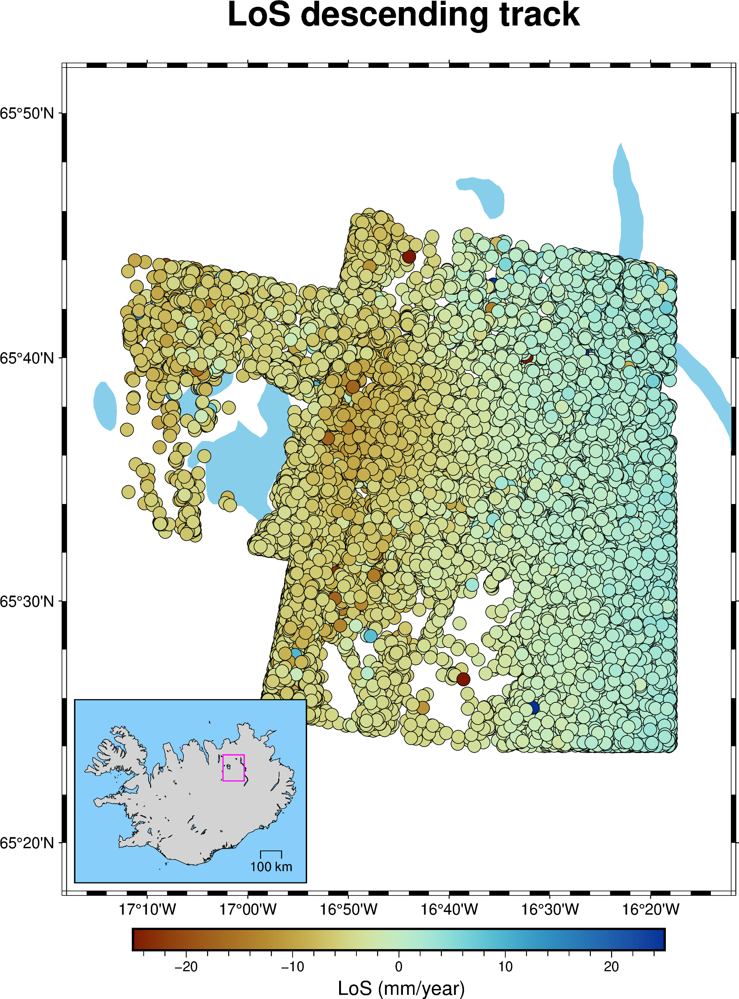

In [1000]:
#plotting descending track scatter points (filtered on amplitude dispersion)

lonmin = filtered_df_dec['longitude'].min()-0.1
lonmax = filtered_df_dec['longitude'].max()+0.1
latmin = filtered_df_dec['latitude'].min()-0.1
latmax = filtered_df_dec['latitude'].max()+0.1
region= [lonmin,  lonmax, latmin, latmax]



fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(shorelines="1/0.5p,black", water="skyblue")
pygmt.makecpt(cmap="roma", series=[-25, 25])

fig.plot(x= filtered_df_dec['longitude'],y= filtered_df_dec['latitude'], cmap=True, style="c0.3c", fill=filtered_df_dec['mean_velocity'], pen="black", frame="+t LoS descending track")
fig.colorbar(frame="xaf+l LoS (mm/year)")


# Make the inset, indicating the region of interest, with all of its features
with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
    fig.coast(
        region="-25/-13/63/67",
        projection="M?", borders=[1, 2],
        land="lightgray", water="lightskyblue",
        shorelines="0.2p,black", map_scale="n0.85/0.15+l+c127.7/34.95+w100"
    )

    rectangle = [[region[0], region[2], region[1], region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Ensure the "presentation" folder exists
os.makedirs("presentation", exist_ok=True)

# Save the figure in the "presentation" folder
fig.savefig("presentation/los_decending_points.png")

fig.show()



blockmean [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
blockmean [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
blockmean (gmtapi_init_grdheader): Please select compatible -R and -I values


/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/3437103428.py:39: SyntaxWarning: Short-form parameter (T) is not recommended. Use long-form parameter 'tension' instead.
  surface_grid = pygmt.surface(
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values


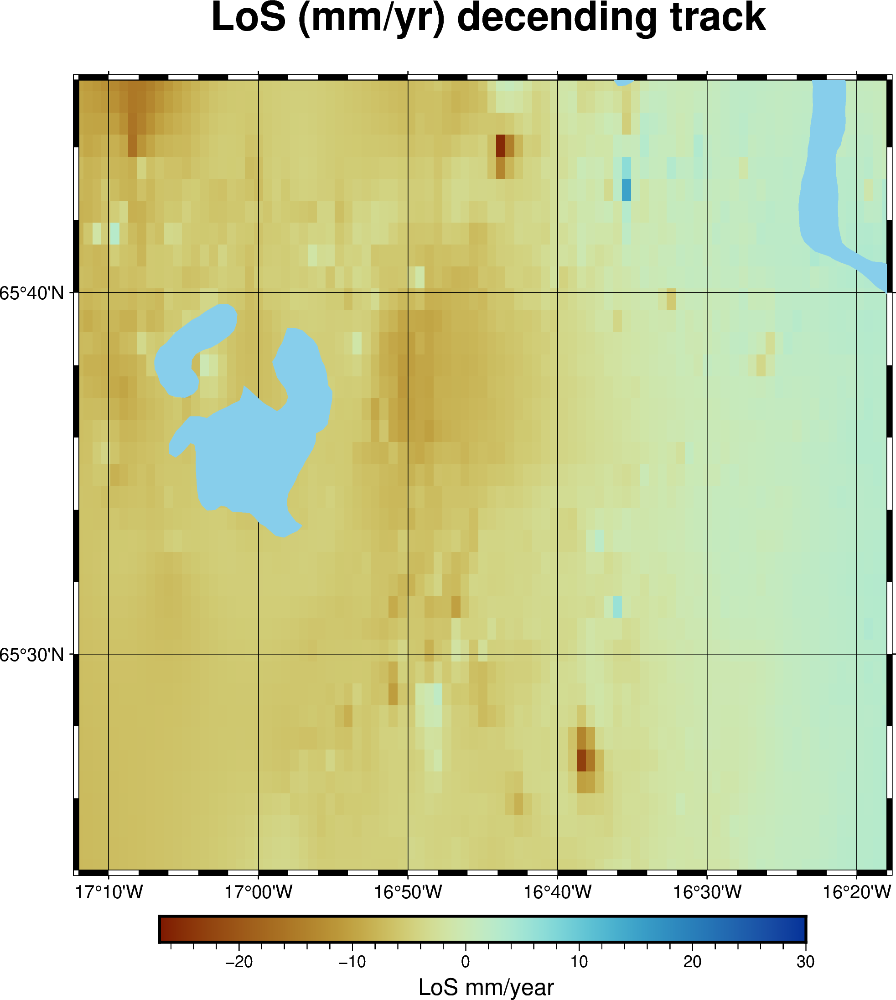

In [1142]:
#plotting descending track grid (filtered on amplitude dispersion)
fig = pygmt.Figure()
fig.set_panel(panel=[1, 1], figsize=(8, 6))

region = [
    filtered_df_dec['longitude'].min(),
    filtered_df_dec['longitude'].max() ,
    filtered_df_dec['latitude'].min() ,
    filtered_df_dec['latitude'].max()
]

# Create a temporary DataFrame 
temp_df = filtered_df_dec[['longitude', 'latitude', 'mean_velocity']]


# Create a blockmean grid
blockmean_output = pygmt.blockmean(
    data=temp_df,
    region=region,
    spacing="0.01"
)

# Create a surface grid
surface_grid = pygmt.surface(
    data=blockmean_output,
    region=region,
    spacing="0.01",
    T=0.25  # Adjust Tension factor for smoother grid
)

# Set the color palette
pygmt.makecpt(cmap="roma", series=[-27, 30])

# Plot the surface grid
fig.grdimage(
    grid=surface_grid,
    region=region,
    projection="M15c",
    frame=["afg", "+t LoS (mm/yr) decending track"],
    cmap=True
)

# Add coastlines
fig.coast(
    shorelines="1/0.5p,black",
    water="skyblue"
)

# Add colorbar
fig.colorbar(frame="xaf+l LoS mm/year")


# # Create the inset (uncomment for inset of area in iceland)
# with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
#     fig.coast(
#         region="-25/-13/63/67",
#         projection="M?",
#         borders=[1, 2],
#         land="lightgray",
#         water="lightskyblue",
#         shorelines="0.2p,black",
#         map_scale="n0.85/0.15+l+c127.7/34.95+w100"
#     )
#     rectangle = [[region[0], region[2], region[1], region[3]]]
#     fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Ensure the "presentation" folder exists
os.makedirs("presentation", exist_ok=True)

# Save the figure in the "presentation" folder
fig.savefig("presentation/los_decending_grid.png")
# Show the figure
fig.show()

**Create same grid for ascending and descending tracks and average the velocity in grid cells**

Weighted average is used based on amplitude dispersion and/or temporal coherence

In [1001]:


# Function to calculate weighted average
def weighted_avg(values, weights):
    return np.average(values, weights=weights)

#Make a grid for ascending and descending tracks that use the same grid
def weighted_average_grid(df_combined_asc, df_combined_dec, lat_grid, lon_grid, resolution):
    result_df_asc = pd.DataFrame(columns=['latitude', 'longitude', 'weighted_velocity', 'mean_incidence_angle', 'mean_track_angle'])
    result_df_dec = pd.DataFrame(columns=['latitude', 'longitude', 'weighted_velocity', 'mean_incidence_angle', 'mean_track_angle'])
    counter = 0
    velocitygrid_asc = np.full(lat_grid.shape, np.nan)
    velocitygrid_dec = np.full(lat_grid.shape, np.nan)
    # Iterate over each grid point
    for i in range(lat_grid.shape[0]):
        for j in range(lon_grid.shape[1]):
            counter += 1
            if counter % 100 == 0:
                print(f'Processed {counter} grid points')

            lat_center = lat_grid[i, j]
            lon_center = lon_grid[i, j]
            
            lat_min_region = lat_center - resolution / 2
            lat_max_region = lat_center + resolution / 2
            lon_min_region = lon_center - resolution / 2
            lon_max_region = lon_center + resolution / 2
            
            # Select points within the region for both ascending and descending
            regional_points_asc = df_combined_asc[
                (df_combined_asc['latitude'] >= lat_min_region) & (df_combined_asc['latitude'] <= lat_max_region) &
                (df_combined_asc['longitude'] >= lon_min_region) & (df_combined_asc['longitude'] <= lon_max_region)
            ]
            
            regional_points_dec = df_combined_dec[
                (df_combined_dec['latitude'] >= lat_min_region) & (df_combined_dec['latitude'] <= lat_max_region) &
                (df_combined_dec['longitude'] >= lon_min_region) & (df_combined_dec['longitude'] <= lon_max_region)
            ]
            
            # Check if both ascending and descending points are present
            if not regional_points_asc.empty and not regional_points_dec.empty:

                if not regional_points_asc.empty:
                    # Sort points by amplitude dispersion (ascending order)
                    sorted_points_asc = regional_points_asc.sort_values(by='amplitude_dispersion')
                    
                    #sorted_points_asc = regional_points_asc.sort_values(by=['amplitude_dispersion', 'time_coherence'], ascending=[True, False])
    
                    # Assign weights based on time coherence and amplitude dispersion
                    # uncomment method you want to use
                    sorted_points_asc['weight'] = 1/sorted_points_asc['amplitude_dispersion']
                    #sorted_points_asc['weight'] = sorted_points_asc['temporal_coherence']
                    #sorted_points_asc['weight'] = sorted_points_asc['temporal_coherence']/sorted_points_asc['amplitude_dispersion']

                    
                    # Calculate weighted average velocity
                    weighted_velocity_asc = weighted_avg(sorted_points_asc['mean_velocity'], sorted_points_asc['weight'])
                   
                    # Calculate mean incidence angle and track angle
                    mean_incidence_angle_asc = sorted_points_asc['incidence_angle'].mean()
                    mean_track_angle_asc = sorted_points_asc['track_angle'].mean()

                    # Create a temporary DataFrame for the current grid point
                    temp_df_asc = pd.DataFrame({
                        'latitude': [lat_center],
                        'longitude': [lon_center],
                        'weighted_velocity': [weighted_velocity_asc],
                        'mean_incidence_angle': [mean_incidence_angle_asc],
                        'mean_track_angle': [mean_track_angle_asc]
                    })
                    
                    # Concatenate the temporary DataFrame to the result DataFrame
                    result_df_asc = pd.concat([result_df_asc, temp_df_asc], ignore_index=True)
                
                # Process descending points
                if not regional_points_dec.empty:
                    # Sort points by amplitude dispersion (ascending order)
                    sorted_points_dec = regional_points_dec.sort_values(by ='amplitude_dispersion')
                    
                    # Assign weights inversely proportional to amplitude dispersion
                    sorted_points_dec['weight'] = 1/sorted_points_dec['amplitude_dispersion']
                    #sorted_points_asc['weight'] = sorted_points_asc['temporal_coherence']
                    #sorted_points_asc['weight'] = sorted_points_asc['temporal_coherence']/sorted_points_asc['amplitude_dispersion']

                    # Calculate weighted average velocity
                    weighted_velocity_dec = weighted_avg(sorted_points_dec['mean_velocity'], sorted_points_dec['weight'])
                    velocitygrid_dec[i, j] = weighted_velocity_dec

                    # Calculate mean incidence angle and track angle
                    mean_incidence_angle_dec = sorted_points_dec['incidence_angle'].mean()
                    mean_track_angle_dec = sorted_points_dec['track_angle'].mean()

                    # Create a temporary DataFrame for the current grid point
                    temp_df_dec = pd.DataFrame({
                        'latitude': [lat_center],
                        'longitude': [lon_center],
                        'weighted_velocity': [weighted_velocity_dec],
                        'mean_incidence_angle': [mean_incidence_angle_dec],
                        'mean_track_angle': [mean_track_angle_dec]
                    })
                    
                    # Concatenate the temporary DataFrame to the result DataFrame
                    result_df_dec = pd.concat([result_df_dec, temp_df_dec], ignore_index=True)

    return result_df_asc, result_df_dec

In [1005]:
import time
# Concatenate the ascending and descending DataFrames
df_combined_all = pd.concat([df_combined_asc, df_combined_dec], ignore_index=True)

# Define the bounds
lat_min = df_combined_all['latitude'].min()
lat_max = df_combined_all['latitude'].max()
lon_min = df_combined_all['longitude'].min()
lon_max = df_combined_all['longitude'].max()

# Define the grid resolution
resolution = 0.005  # Adjust this based on your desired resolution

# Create the grid
lats = np.arange(lat_min, lat_max, resolution)
lons = np.arange(lon_min, lon_max, resolution)

# Create a meshgrid
lon_grid, lat_grid = np.meshgrid(lons, lats)
print(lon_grid.shape, lat_grid.shape)
# Calculate the weighted average grid
start_time = time.time()  # Start timing
result_df_asc, velocitygrid_asc, result_df_dec, velocitygrid_dec = weighted_average_grid(df_combined_asc,df_combined_dec, lat_grid, lon_grid, resolution)
end_time = time.time()  # End timing
elapsed_time = end_time - start_time
print(f"Function executed in {elapsed_time:.2f} seconds for resolution {resolution}")


(100, 180) (100, 180)
Processed 10 grid points
Processed 20 grid points
Processed 30 grid points
Processed 40 grid points
Processed 50 grid points
Processed 60 grid points
Processed 70 grid points
Processed 80 grid points
Processed 90 grid points
Processed 100 grid points
Processed 110 grid points
Processed 120 grid points


/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/724982620.py:72: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df_asc = pd.concat([result_df_asc, temp_df_asc], ignore_index=True)
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/724982620.py:99: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df_dec = pd.concat([result_df_dec, temp_df_dec], ignore_index=True)


Processed 130 grid points
Processed 140 grid points
Processed 150 grid points
Processed 160 grid points
Processed 170 grid points
Processed 180 grid points
Processed 190 grid points
Processed 200 grid points
Processed 210 grid points
Processed 220 grid points
Processed 230 grid points
Processed 240 grid points
Processed 250 grid points
Processed 260 grid points
Processed 270 grid points
Processed 280 grid points
Processed 290 grid points
Processed 300 grid points
Processed 310 grid points
Processed 320 grid points
Processed 330 grid points
Processed 340 grid points
Processed 350 grid points
Processed 360 grid points
Processed 370 grid points
Processed 380 grid points
Processed 390 grid points
Processed 400 grid points
Processed 410 grid points
Processed 420 grid points
Processed 430 grid points
Processed 440 grid points
Processed 450 grid points
Processed 460 grid points
Processed 470 grid points
Processed 480 grid points
Processed 490 grid points
Processed 500 grid points
Processed 51

In [532]:
result_df_dec.shape, result_df_asc.shape
import os

# Define the directory name
results_dir = 'results'

# Create the directory if it doesn't exist
os.makedirs(results_dir, exist_ok=True)

# Save the DataFrames to CSV files within the directory
result_df_asc.to_csv(os.path.join(results_dir, 'result_df_asc_0.005res.csv'), index=False)
result_df_dec.to_csv(os.path.join(results_dir, 'result_df_dec_0.005res.csv'), index=False)

print("Files have been saved successfully in the 'results' folder.")


Files have been saved successfully in the 'results' folder.


In [725]:
# Assuming you have already executed the code to obtain result_df_dec
# Check for NaN values in result_df_dec
nan_rows_dec = result_df_dec[result_df_dec.isnull().any(axis=1)]

# Print the rows with NaN values
print("Rows with NaN values in result_df_dec:")
print(nan_rows_dec)

Rows with NaN values in result_df_dec:
Empty DataFrame
Columns: [latitude, longitude, weighted_velocity, mean_incidence_angle, mean_track_angle]
Index: []


**Decompose the LoS in reference to the plate spreading**

In [1006]:
def decompose_du_de_rot(theta1,alpha1, theta2, alpha2, los1, los2, rat_rot):
    """
    decompose los in dE and dU
    two methods one is using the matrix method and the other is using the trigonometric method

    Parameters:
    theta1 (np.array) or float: array of theta values for the first track
    alpha1 (np.array) or float: array of alpha values for the first track
    theta2 (np.array) or float: array of theta values for the second track
    alpha2 (np.array) or float: array of alpha values for the second track
    los1 (np.array) or float: array of los values for the first track
    los2 (np.array) or float: array of los values for the second track
    rat_rot (float): rotation of local coordinate system

    Returns:
    decomp (np.array): array of dE and dU values
    """
    # decomp = np.zeros((theta1.size, 2))
    # R1= np.array([
    #         [np.cos(np.radians(rat_rot)), np.sin(np.radians(rat_rot)),0], 
    #         [-np.sin(np.radians(rat_rot)), np.cos(np.radians(rat_rot)), 0],
    #         [0, 0, 1]])
    # matrix = np.array([
    #     [-np.sin(theta1)*np.sin(alpha1-((3/2)*np.pi)), -np.sin(theta1)*np.cos(alpha1-((3/2)*np.pi)), np.cos(theta1)],
    #     [-np.sin(theta2)*np.sin(alpha2-((3/2)*np.pi)), -np.sin(theta2)*np.cos(alpha2-((3/2)*np.pi)), np.cos(theta2)]])
   
    # A= matrix@R1
    # A1= matrix = np.delete(A, 1, axis=1)

    # # for i in range(los1.size):
    # los = np.array([los1, los2])
    # decomp = np.linalg.solve(matrix,los )
    # dP= decomp[0]
    # dU= decomp[1]

    # return dP, dU
    decomp = np.zeros((los1.size, 2))
    for i in range(theta1.size):
        matrix = np.array([[-np.sin(theta1[i])*np.sin(alpha1[i]-(3*np.pi/2))*np.cos(np.radians(rat_rot)), np.cos(theta1[i])], 
            [-np.sin(theta2[i])*np.sin(alpha2[i]-(3*np.pi/2))*np.cos(np.radians(rat_rot)), np.cos(theta2[i])]])
        los = np.array([los1[i], los2[i]])
        decomp[i,:] = np.linalg.solve(matrix,los)
        dE= decomp[:, 0]
        dU= decomp[:, 1]

    return dE, dU

In [1236]:
#getting decomposed velocities
theta1= result_df_asc['mean_incidence_angle'].values
theta2= result_df_dec['mean_incidence_angle'].values
alpha1= result_df_asc['mean_track_angle'].values
alpha2= result_df_dec['mean_track_angle'].values
los1= result_df_asc['weighted_velocity'].values
los2= result_df_dec['weighted_velocity'].values

dP, dU= decompose_du_de_rot(np.radians(theta1),np.radians(alpha1), np.radians(theta2), np.radians(alpha2), los1, los2, 22)


In [1237]:
# Create DataFrame for latitude and longitude
df_coords = result_df_asc[['latitude', 'longitude']].copy()

# Create DataFrame for dU and dP
df_velocities = pd.DataFrame({
    'dU': dU,
    'dP': dP
})

# Combine df_coords and df_velocities
df_combined_velocities = pd.concat([df_coords, df_velocities], axis=1)



In [765]:
# # Define the directory name
# results_dir = 'results'

# # Create the directory if it doesn't exist
# os.makedirs(results_dir, exist_ok=True)

# # Save the DataFrames to CSV files within the directory
# df_combined_velocities.to_csv(os.path.join(results_dir, 'df_decomposed_velocities_0.01res.csv'), index=False)


# print("Files have been saved successfully in the 'results' folder.")

Files have been saved successfully in the 'results' folder.


**Visualise Plate Spreading**

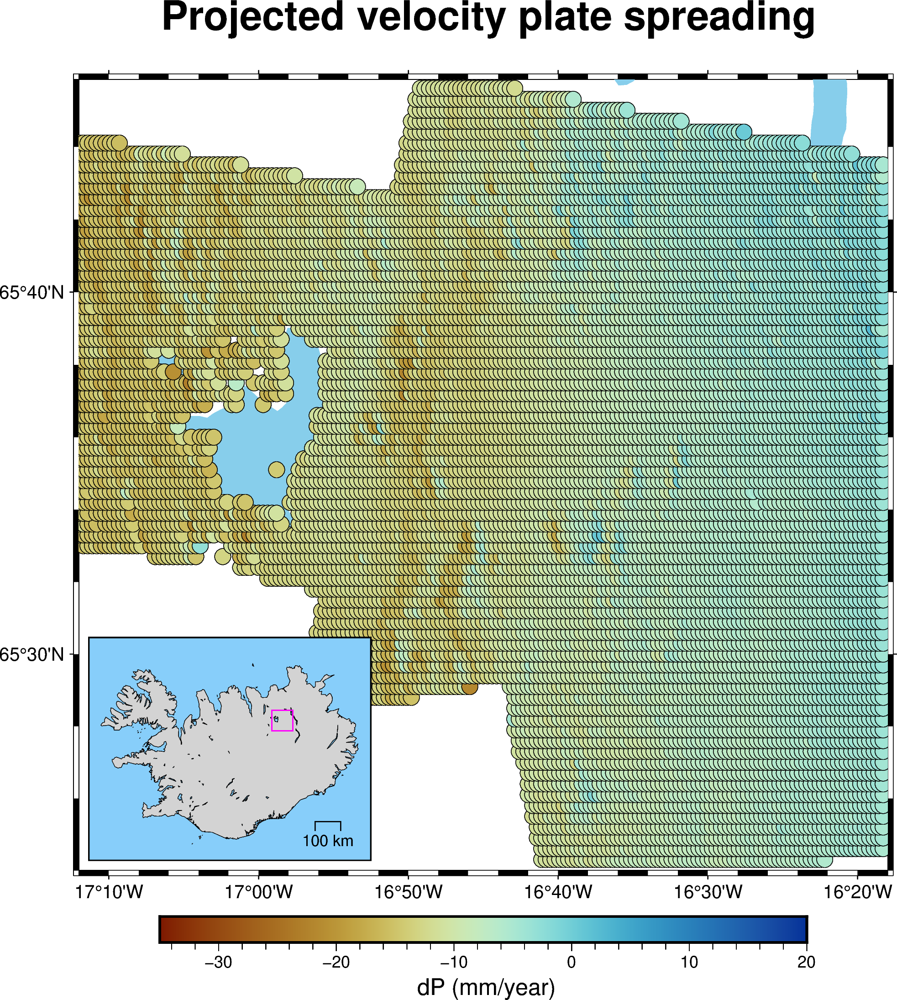

In [1054]:
#plotting decomposed velocities
lonmin = filtered_df_dec['longitude'].min()
lonmax = filtered_df_dec['longitude'].max()
latmin = filtered_df_dec['latitude'].min()
latmax = filtered_df_dec['latitude'].max()
region= [lonmin,  lonmax, latmin, latmax]



fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(shorelines="1/0.5p,black", water="skyblue")
pygmt.makecpt(cmap="roma", series=[-35, 20])

fig.plot(x= df_combined_velocities['longitude'],y= df_combined_velocities['latitude'], cmap=True, style="c0.3c", fill=df_combined_velocities['dP'], pen="black", frame="+t Projected velocity plate spreading")
fig.colorbar(frame="xaf+l dP (mm/year)")


# Make the inset, indicating the region of interest, with all of its features
with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
    fig.coast(
        region="-25/-13/63/67",
        projection="M?", borders=[1, 2],
        land="lightgray", water="lightskyblue",
        shorelines="0.2p,black", map_scale="n0.85/0.15+l+c127.7/34.95+w100"
    )

    rectangle = [[region[0], region[2], region[1], region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Ensure the "presentation" folder exists
os.makedirs("presentation", exist_ok=True)

# Save the figure in the "presentation" folder
#fig.savefig("presentation/los_decending_points.png")

fig.show()



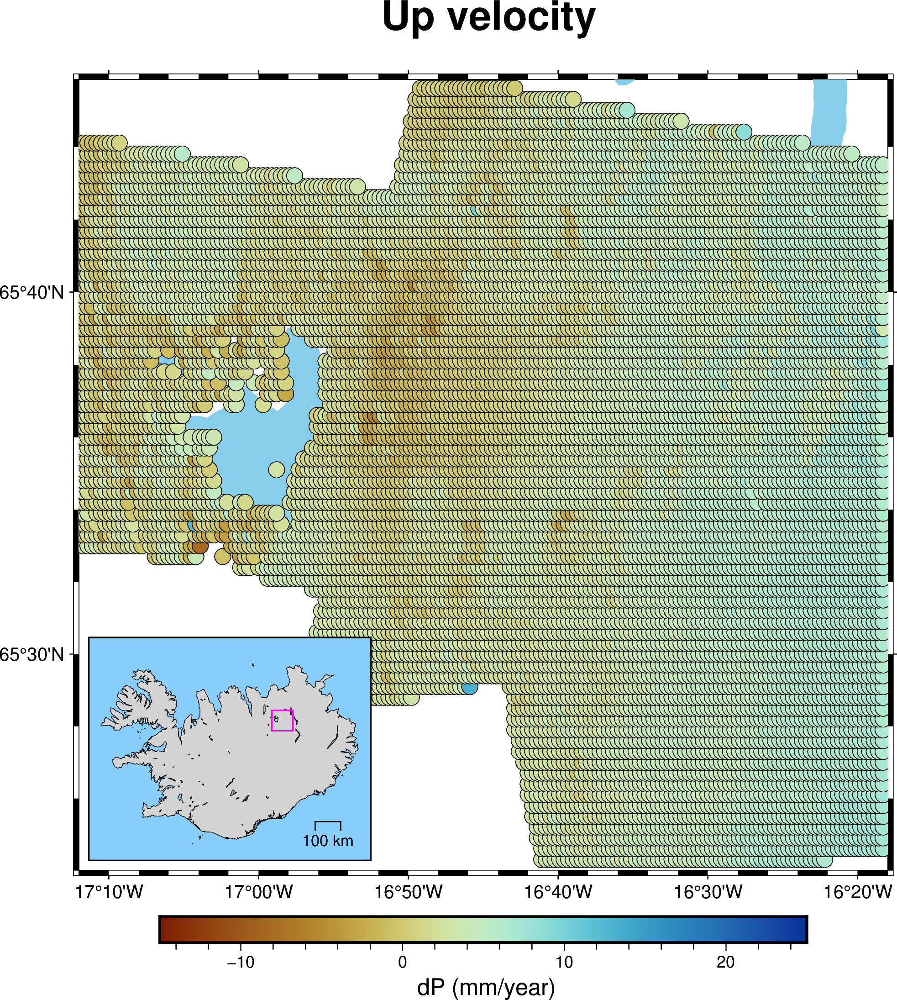

In [1059]:
#plot of decomposed Up velocities

lonmin = filtered_df_dec['longitude'].min()
lonmax = filtered_df_dec['longitude'].max()
latmin = filtered_df_dec['latitude'].min()
latmax = filtered_df_dec['latitude'].max()
region= [lonmin,  lonmax, latmin, latmax]



fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(shorelines="1/0.5p,black", water="skyblue")
pygmt.makecpt(cmap="roma", series=[-15, 25])

fig.plot(x= df_combined_velocities['longitude'],y= df_combined_velocities['latitude'], cmap=True, style="c0.3c", fill=df_combined_velocities['dU'], pen="black", frame="+t Up velocity")
fig.colorbar(frame="xaf+l dP (mm/year)")


# Make the inset, indicating the region of interest, with all of its features
with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
    fig.coast(
        region="-25/-13/63/67",
        projection="M?", borders=[1, 2],
        land="lightgray", water="lightskyblue",
        shorelines="0.2p,black", map_scale="n0.85/0.15+l+c127.7/34.95+w100"
    )

    rectangle = [[region[0], region[2], region[1], region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Ensure the "presentation" folder exists
os.makedirs("presentation", exist_ok=True)

# Save the figure in the "presentation" folder
#fig.savefig("presentation/los_decending_points.png")

fig.show()



In [570]:
# df_combined_velocities0_01

# results_dir = 'results'

# # Create the directory if it doesn't exist
# os.makedirs(results_dir, exist_ok=True)

# # Save the DataFrames to CSV files within the directory
# df_combined_velocities0_01.to_csv(os.path.join(results_dir, 'df_decomposed_velocities_0.01res.csv'), index=False)

Visualise plate spreading velocity differently (grid)

blockmean [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
blockmean [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
blockmean (gmtapi_init_grdheader): Please select compatible -R and -I values
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/1661258195.py:23: SyntaxWarning: Short-form parameter (T) is not recommended. Use long-form parameter 'tension' instead.
  surface_grid = pygmt.surface(
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an i

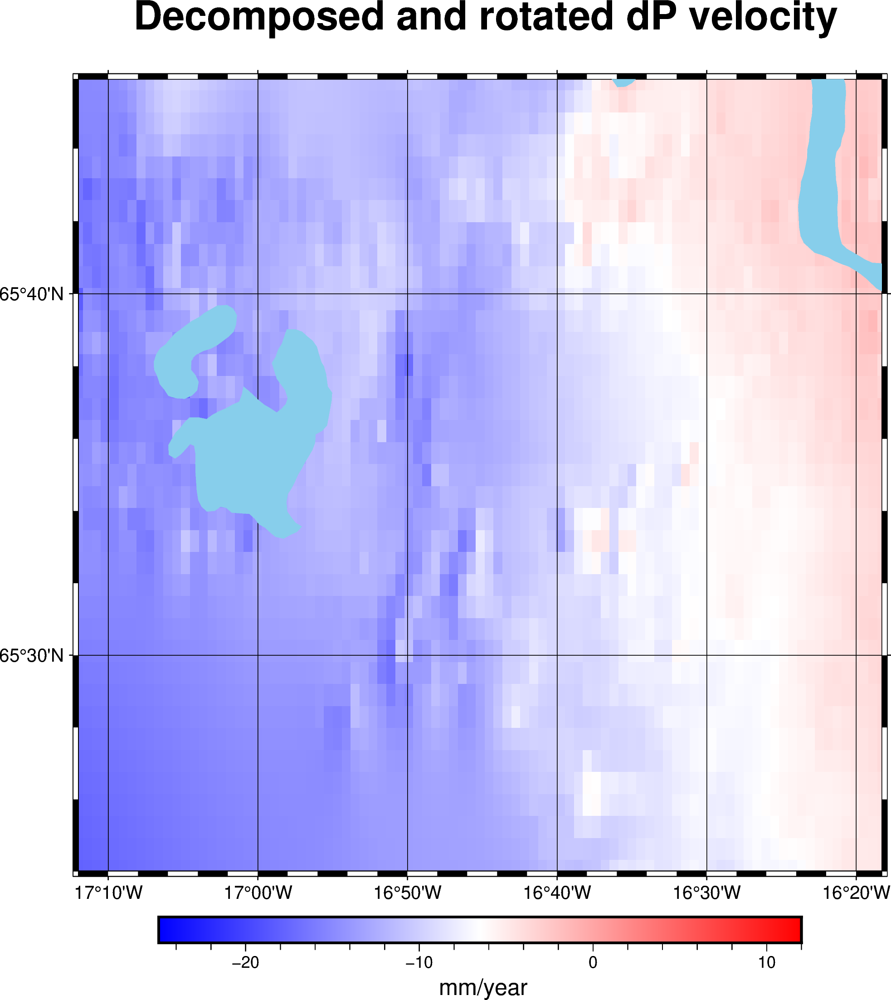

In [1192]:
#plot grid of decomposed dP velocities
fig = pygmt.Figure()


# Define the region based on your data
region = [
    df_combined_velocities0_01['longitude'].min(),
    df_combined_velocities0_01['longitude'].max() ,
    df_combined_velocities0_01['latitude'].min() ,
    df_combined_velocities0_01['latitude'].max()
]

# Create a temporary DataFrame to use with PyGMT blockmean and surface
temp_df = df_combined_velocities[['longitude', 'latitude', 'dP']]

# Create a blockmean grid
blockmean_output = pygmt.blockmean(
    data=temp_df,
    region=region,
    spacing="0.01"
)

# Create a surface grid
surface_grid = pygmt.surface(
    data=blockmean_output,
    region=region,
    spacing="0.01",
    T=0.25  # Adjust Tension factor for smoother grid
)

# Start plotting
fig = pygmt.Figure()

# Set the color palette
pygmt.makecpt(cmap="roma", series=[-25, 12])

# Plot the surface grid
fig.grdimage(
    grid=surface_grid,
    region=region,
    projection="M15c",
    frame=["afg", "+t Decomposed and rotated dP velocity"],
    cmap=True
)

# Add coastlines
fig.coast(
    shorelines="1/0.5p,black",
    water="skyblue"
)

# Add colorbar
fig.colorbar(frame="xaf+l mm/year")

# Save the figure in the "presentation" folder
fig.savefig("presentation/decomposed_dP_grid.png", dpi=300)

# Show the figure
fig.show()

blockmean [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
blockmean [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
blockmean (gmtapi_init_grdheader): Please select compatible -R and -I values
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/277878824.py:23: SyntaxWarning: Short-form parameter (T) is not recommended. Use long-form parameter 'tension' instead.
  surface_grid = pygmt.surface(
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an in

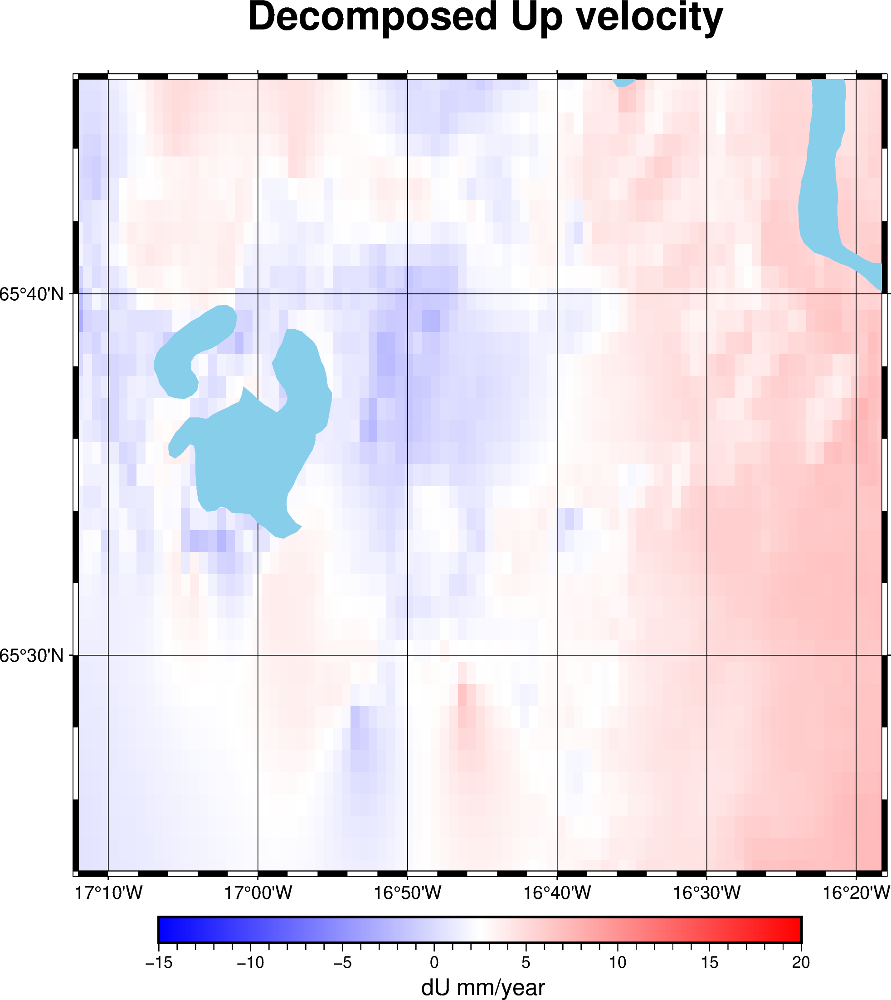

In [1258]:
fig = pygmt.Figure()


# Define the region based on your data
region = [
    df_combined_velocities['longitude'].min(),
    df_combined_velocities['longitude'].max() ,
    df_combined_velocities['latitude'].min() ,
    df_combined_velocities['latitude'].max()
]

# Create a temporary DataFrame to use with PyGMT blockmean and surface
temp_df = df_combined_velocities[['longitude', 'latitude', 'dU']]

# Create a blockmean grid
blockmean_output = pygmt.blockmean(
    data=temp_df,
    region=region,
    spacing="0.01"
)

# Create a surface grid
surface_grid = pygmt.surface(
    data=blockmean_output,
    region=region,
    spacing="0.01",
    T=0.25  # Adjust Tension factor for smoother grid
)

# Start plotting
fig = pygmt.Figure()

# Set the color palette
pygmt.makecpt(cmap="roma", series=[-15, 20])

# Plot the surface grid
fig.grdimage(
    grid=surface_grid,
    region=region,
    projection="M15c",
    frame=["afg", "+t Decomposed Up velocity"],
    cmap=True
)

# Add coastlines
fig.coast(
    shorelines="1/0.5p,black",
    water="skyblue"
)

# Add colorbar
fig.colorbar(frame="xaf+l dU mm/year")

# Create the inset
# with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
#     fig.coast(
#         region="-25/-13/63/67",
#         projection="M?",
#         borders=[1, 2],
#         land="lightgray",
#         water="lightskyblue",
#         shorelines="0.2p,black",
#         map_scale="n0.85/0.15+l+c127.7/34.95+w100"
#     )
#     rectangle = [[region[0], region[2], region[1], region[3]]]
#     fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Save the figure in the "presentation" folder
fig.savefig("presentation/decomposed_dU_grid.png", dpi=300)

# Show the figure
fig.show()

In [1076]:
# Change coordinate system from WGS84 to ISN9947
#Beaware it takes long for a lot of data
# iceland coordinate system EPSG:9947
# import pyproj as proj



from pyproj import Proj, transform


# WGS84 (latitude and longitude)
wgs84 = Proj(proj='latlong', datum='WGS84')

# ISN9947 (Icelandic coordinate system)

isn9947 = Proj(init='EPSG:9947 ')


# Function to transform coordinates
def transform_coords(row):
    lon, lat = row['longitude'], row['latitude']
    x, y = transform(wgs84, isn9947, lon, lat)
    return pd.Series({'x': x, 'y': y})

# Apply transformation to each row
df_combined_velocities0_01[['x', 'y']] = df_combined_velocities0_01.apply(transform_coords, axis=1)



/Users/isabelslingerland/opt/anaconda3/envs/pygmt/lib/python3.12/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/3828703714.py:20: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x, y = transform(wgs84, isn9947, lon, lat)


**rotate the plate spreading signal to a position so the velocity only depends on 1 dimension (the rotated x direction)**

In [1077]:
#rotation matrix for rotation of local coordinate system
def rotation(theta,x,y):
    """
    rotation matrix
    theta: angle in radians anticlockwise(positive)
    """
    rot_matrix=np.array([[np.cos(theta), -np.sin(theta)], [np.sin(theta), np.cos(theta)]])
    vec = np.array([x, y])
    return rot_matrix@vec

In [ ]:
#rotating the local coordinate system clock wise 22 degrees
vec= rotation(np.radians(-22), df_combined_velocities['x'], df_combined_velocities['y'])
df_combined_velocities['x_rotated']= vec[0]
df_combined_velocities['y_rotated']= vec[1]


**Fit a model to the plate spreading velocity**

Slope: 0.00033688201887288534, Intercept: -746.2803048339326


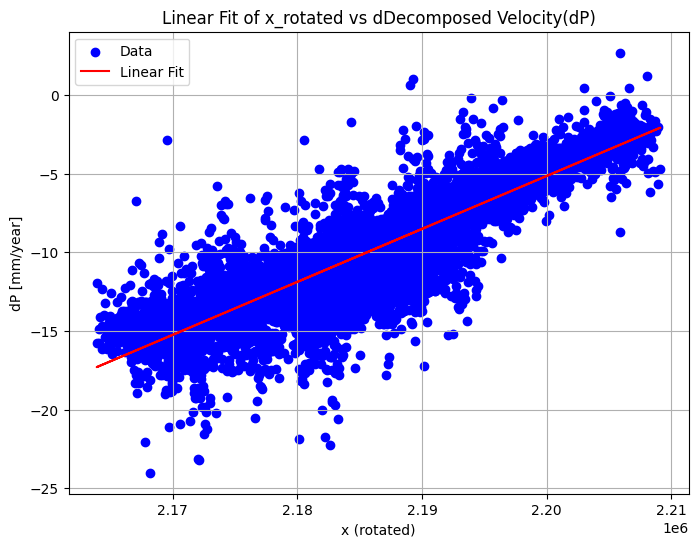

In [1079]:
#fit model of plate spreading velocity only depending on rotated x

# Fit a linear function (polynomial of degree 1)
coefficients = np.polyfit(df_combined_velocities['x_rotated'], df_combined_velocities['dP'], deg=1)
slope, intercept = coefficients

# Print the coefficients of the linear fit
print(f"Slope: {slope}, Intercept: {intercept}")

# Create a scatter plot with the linear fit
plt.figure(figsize=(8, 6))
plt.scatter(df_combined_velocities['x_rotated'], df_combined_velocities['dP'], color='blue', label='Data')
plt.plot(df_combined_velocities['x_rotated'], slope * df_combined_velocities['x_rotated'] + intercept, color='red', label='Linear Fit')
plt.xlabel('x (rotated)')
plt.ylabel('dP [mm/year]')
plt.title('Linear Fit of x_rotated vs dDecomposed Velocity(dP)')
plt.legend()
plt.grid(True)
plt.show()

# Save the figure in the "presentation" folder
#fig.savefig("presentation/linear_fit_x_rotated_dP_16deg.png")


In [1080]:
def divergent_plate_func(x, slope, intercept):
    """
    Calculate divergent plate velocity for a given x value.
    """
    return slope * x + intercept

**Put the original data to the rotated reference frame**

In [888]:
#  now put the original data to reference frame.
# I filtered the data to get less point scatters as it takes very long to run 
# (0.3 dispersion threshold, takes 10 minutes to run but if you already go up to 0.35 it takes 30 minutes to run)

filtered_asc = filter_data(df_combined_asc, dispersion_threshold=0.3)
filtered_dec = filter_data(df_combined_dec, dispersion_threshold=0.3)
filtered_asc[['x', 'y']] = filtered_asc.apply(transform_coords, axis=1)
filtered_dec[['x', 'y']] = filtered_dec.apply(transform_coords, axis=1)

filtered_asc

/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/3828703714.py:20: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x, y = transform(wgs84, isn9947, lon, lat)
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/3434863808.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_asc[['x', 'y']] = filtered_asc.apply(transform_coords, axis=1)
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/3434863808.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata

,index,mean_velocity,latitude,longitude,amplitude_dispersion,temporal_coherence,incidence_angle,track_angle,x,y
68,406130,7.2,65.416788,-16.512313,0.29,0.85,41.83,349.40,1.815496e+06,1.348742e+06
74,5745233,11.3,65.514959,-17.015356,0.23,0.98,40.63,348.97,1.791806e+06,1.358857e+06
250,4405248,8.9,65.556733,-16.733313,0.27,0.93,41.42,349.23,1.804680e+06,1.363950e+06
256,17649247,4.7,65.870581,-16.302272,0.27,0.91,42.84,349.69,1.823076e+06,1.399695e+06
266,15298355,3.7,65.782750,-16.308824,0.25,0.94,42.73,349.66,1.823196e+06,1.389898e+06
...,...,...,...,...,...,...,...,...,...,...
999664,3193361,8.5,65.536918,-16.410320,0.25,0.94,42.22,349.52,1.819679e+06,1.362315e+06
999751,14793194,11.5,65.722275,-16.812182,0.29,0.80,41.41,349.19,1.800398e+06,1.382269e+06
999756,4229760,7.7,65.578764,-16.349061,0.22,0.97,42.41,349.58,1.822312e+06,1.367095e+06
999923,5206281,9.6,65.503082,-16.899488,0.26,0.97,40.92,349.07,1.797208e+06,1.357706e+06


In [1082]:
# Rotate the local coordinate system by -22 degrees, original scatter points
vec_asc= rotation(np.radians(-22), filtered_asc['x'], filtered_asc['y'])
vec_dec= rotation(np.radians(-22), filtered_dec['x'], filtered_dec['y'])

# Assign rotated coordinates using .loc
filtered_asc.loc[:, 'x_rotated'] = vec_asc[0]
filtered_asc.loc[:, 'y_rotated'] = vec_asc[1]
filtered_dec.loc[:, 'x_rotated'] = vec_dec[0]
filtered_dec.loc[:, 'y_rotated'] = vec_dec[1]



In [1083]:
x_rot_sp_asc= filtered_asc['x_rotated'].values
x_rot_sp_dec= filtered_dec['x_rotated'].values
plate_velocity_at_sp_asc = divergent_plate_func(x_rot_sp_asc, slope, intercept)
plate_velocity_at_sp_dec = divergent_plate_func(x_rot_sp_dec, slope, intercept)

In [1094]:
def compose_los(theta,alpha, dP,rotation_angle):
    """
    compose los from dP and dU
    """
    los=  (np.sin(theta[i])*np.cos(np.radians(rotation_angle))*np.sin(alpha-(3*np.pi/2)))*dP
   
    # matrix = np.array([[np.sin(theta1)*np.sin(alpha1), np.cos(theta1)], [np.sin(theta2)*np.sin(alpha2), np.cos(theta2)]])
    # decomp = np.linalg.solve(matrix, np.array([los1, los2]))
    return los


In [1095]:
# set values 
theta1= filtered_asc['incidence_angle'].values
theta2= filtered_dec['incidence_angle'].values
alpha1= filtered_asc['track_angle'].values
alpha2= filtered_dec['track_angle'].values



((14880,), (14880,), (11945,), (11945,), (14880,), (11945,))

In [1096]:
# compose los for acsending and descending tracks
los_asc= compose_los(theta1,alpha1, plate_velocity_at_sp_asc, -22)
los_dec= compose_los(theta2,alpha2, plate_velocity_at_sp_dec, -22)

**Subtract the plates spreading 'los' from the total velocity**

In [1097]:
filtered_asc.loc[:,'los']= los_asc
filtered_dec.loc[:,'los']= los_dec
filtered_asc.loc[:,'residual']= filtered_asc['mean_velocity']-filtered_asc['los']
filtered_dec.loc[:,'residual']= filtered_dec['mean_velocity']-filtered_dec['los']

**Visualise residual signal**

blockmean [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
blockmean [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
blockmean (gmtapi_init_grdheader): Please select compatible -R and -I values
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/1456171568.py:23: SyntaxWarning: Short-form parameter (T) is not recommended. Use long-form parameter 'tension' instead.
  surface_grid = pygmt.surface(
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an i

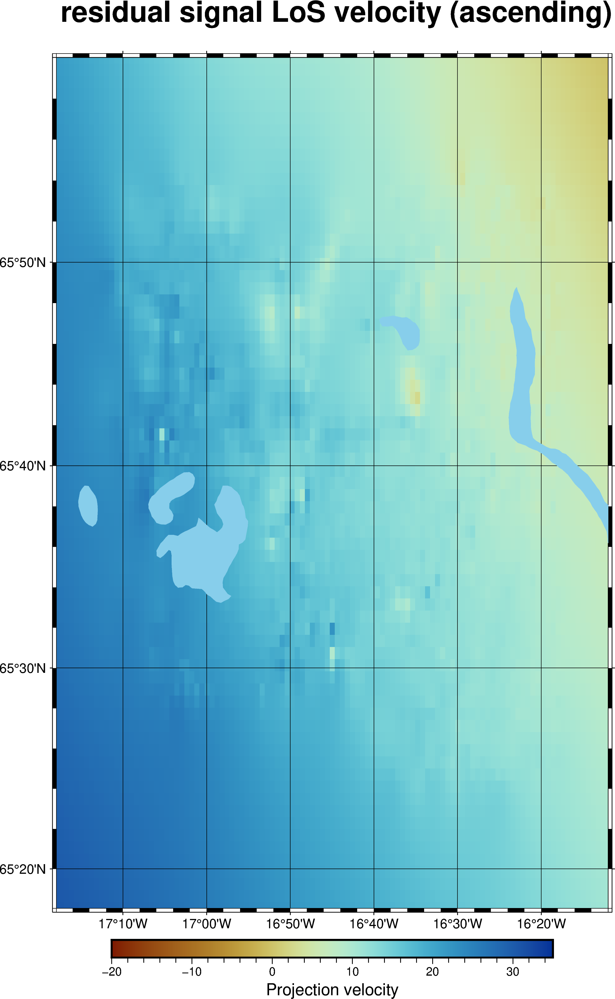

In [1188]:
#fit figure residuals
fig = pygmt.Figure()


# Define the region based on your data
region = [
    filtered_asc['longitude'].min()-0.1,
    filtered_asc['longitude'].max()+0.1 ,
    filtered_asc['latitude'].min()-0.1 ,
    filtered_asc['latitude'].max()+0.1
]

# Create a temporary DataFrame to use with PyGMT blockmean and surface
temp_df = filtered_asc[['longitude', 'latitude', 'residual']]

# Create a blockmean grid
blockmean_output = pygmt.blockmean(
    data=temp_df,
    region=region,
    spacing="0.01"
)

# Create a surface grid
surface_grid = pygmt.surface(
    data=blockmean_output,
    region=region,
    spacing="0.01",
    T=0.25  # Adjust Tension factor for smoother grid
)

# Start plotting
fig = pygmt.Figure()
fig.set_panel(panel=[1, 1], figsize=(10, 8))
# Set the color palette
pygmt.makecpt(cmap="roma", series=[-20, 35])

# Plot the surface grid
fig.grdimage(
    grid=surface_grid,
    region=region,
    projection="M15c",
    frame=["afg", "+t residual signal LoS velocity (ascending)"],
    cmap=True
)

# Add coastlines
fig.coast(
    shorelines="1/0.5p,black",
    water="skyblue"
)

# Add colorbar
fig.colorbar(frame="xaf+lProjection velocity")

# # Create the inset
# with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
#     fig.coast(
#         region="-25/-13/63/67",
#         projection="M?",
#         borders=[1, 2],
#         land="lightgray",
#         water="lightskyblue",
#         shorelines="0.2p,black",
#         map_scale="n0.85/0.15+l+c127.7/34.95+w100"
#     )
#     rectangle = [[region[0], region[2], region[1], region[3]]]
#     fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Show the figure
# Save the figure in the "presentation" folder
fig.savefig("presentation/residuals_los_ascending_grid1.png")
fig.show()

blockmean [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
blockmean [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
blockmean (gmtapi_init_grdheader): Please select compatible -R and -I values
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/4235021748.py:23: SyntaxWarning: Short-form parameter (T) is not recommended. Use long-form parameter 'tension' instead.
  surface_grid = pygmt.surface(
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
surface (gmtapi_init_grdheader): Please select compatible -R and -I values
surface [WARNING]: (x_max-x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
surface [WARNING]: (y_max-y_min) must equal (NY + eps) * y_inc), where NY is an i

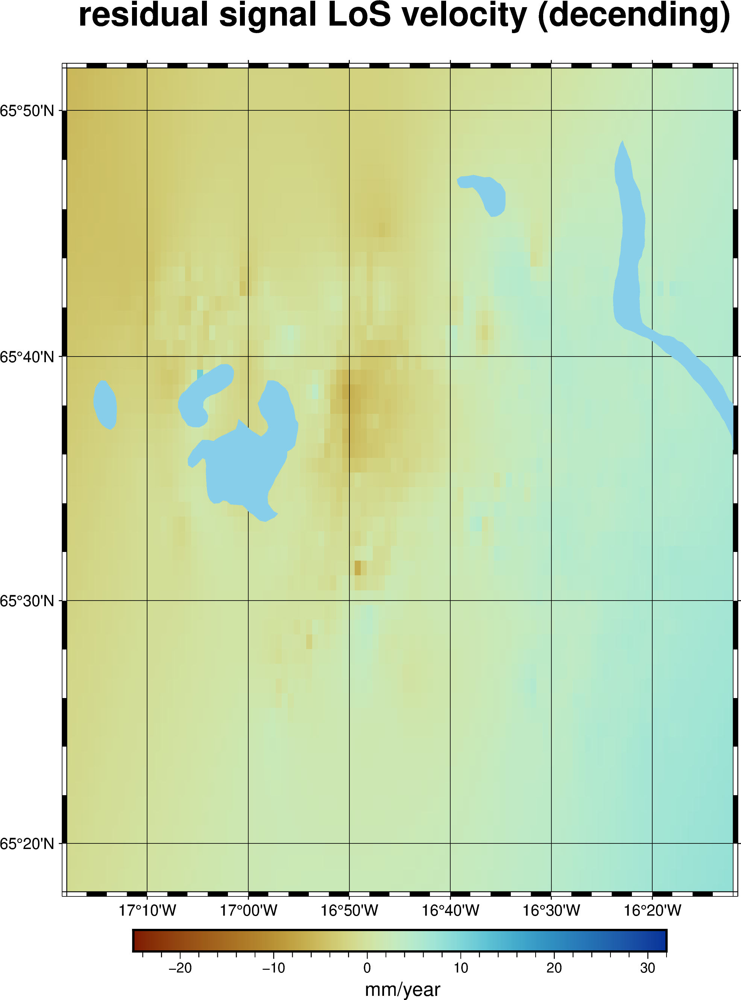

In [1116]:
fig = pygmt.Figure()
fig.set_panel(panel=[1, 1], figsize=(8, 6))

# Define the region based on your data
region = [
    filtered_dec['longitude'].min()-0.1,
    filtered_dec['longitude'].max()+0.1 ,
    filtered_dec['latitude'].min()-0.1 ,
    filtered_dec['latitude'].max()+0.1
]

# Create a temporary DataFrame to use with PyGMT blockmean and surface
temp_df = filtered_dec[['longitude', 'latitude', 'residual']]

# Create a blockmean grid
blockmean_output = pygmt.blockmean(
    data=temp_df,
    region=region,
    spacing="0.01"
)

# Create a surface grid
surface_grid = pygmt.surface(
    data=blockmean_output,
    region=region,
    spacing="0.01",
    T=0.25  # Adjust Tension factor for smoother grid
)

# Start plotting
fig = pygmt.Figure()

# Set the color palette
pygmt.makecpt(cmap="roma", series=[-25, 32])

# Plot the surface grid
fig.grdimage(
    grid=surface_grid,
    region=region,
    projection="M15c",
    frame=["afg", "+t residual signal LoS velocity (decending)"],
    cmap=True
)

# Add coastlines
fig.coast(
    shorelines="1/0.5p,black",
    water="skyblue"
)

# Add colorbar
fig.colorbar(frame="xaf+l mm/year")

# # Create the inset
# with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
#     fig.coast(
#         region="-25/-13/63/67",
#         projection="M?",
#         borders=[1, 2],
#         land="lightgray",
#         water="lightskyblue",
#         shorelines="0.2p,black",
#         map_scale="n0.85/0.15+l+c127.7/34.95+w100"
#     )
#     rectangle = [[region[0], region[2], region[1], region[3]]]
#     fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

# Show the figure
fig.savefig("presentation/residuals_decending_grid.png")
fig.show()

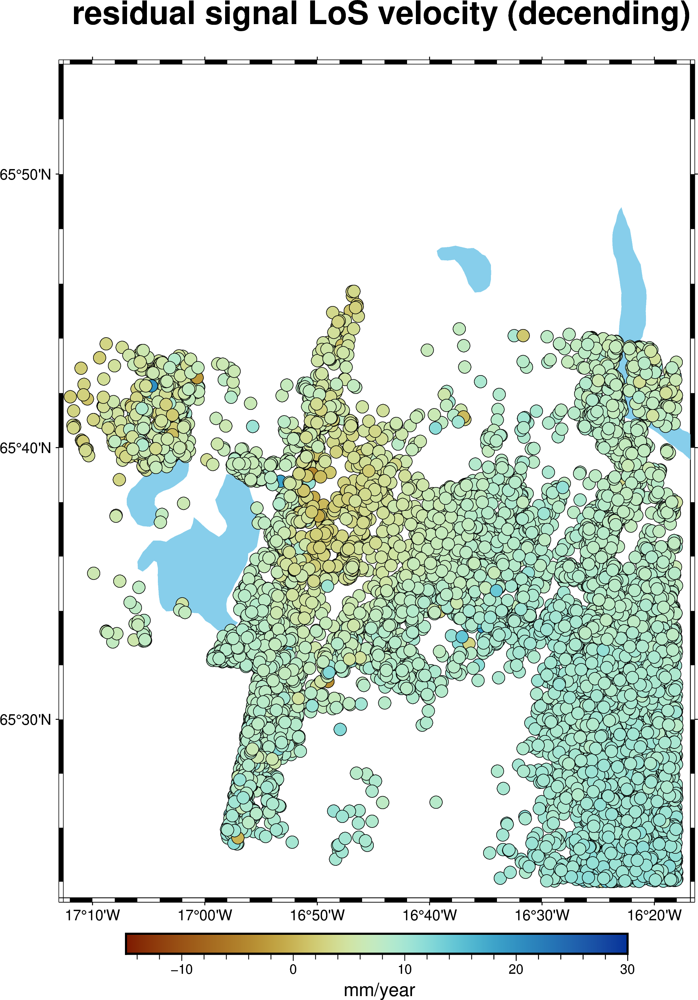

In [917]:
region= [lon_min-0.01, lon_max+0.02, lat_min-0.01, lat_max]
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(shorelines="1/0.5p,black", water="skyblue")
pygmt.makecpt(cmap="roma", series=[-15, 30])

fig.plot(x= filtered_dec['longitude'],y= filtered_dec['latitude'], cmap=True, style="c0.3c", fill=filtered_dec['residual'], pen="black", frame="+t residual signal LoS velocity (decending)")
fig.colorbar(frame="xaf+l mm/year")


# # Make the inset, indicating the region of interest, with all of its features
# with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
#     fig.coast(
#         region="-25/-13/63/67",
#         projection="M?", borders=[1, 2],
#         land="lightgray", water="lightskyblue",
#         shorelines="0.2p,black", map_scale="n0.85/0.15+l+c127.7/34.95+w100"
#     )

    # rectangle = [[region[0], region[2], region[1], region[3]]]
    # fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")

fig.savefig("presentation/residuals_decending_points.png")
fig.show()

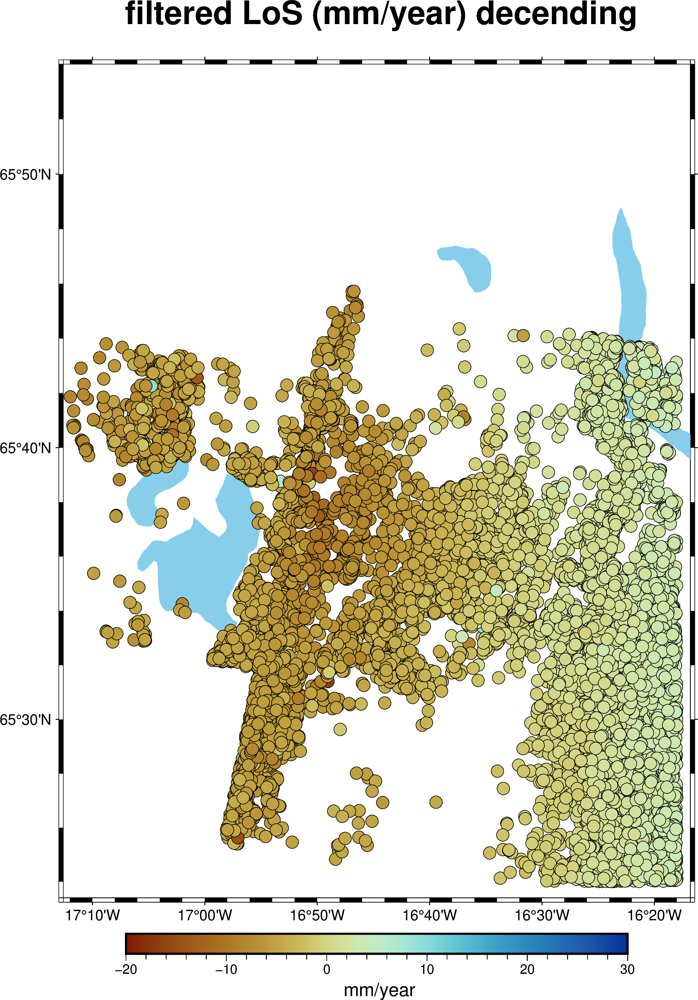

In [913]:
#plot original scatter points just to compare to residuals
region= [lon_min-0.01, lon_max+0.02, lat_min-0.01, lat_max]
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(shorelines="1/0.5p,black", water="skyblue")
pygmt.makecpt(cmap="roma", series=[-20, 30])

fig.plot(x= filtered_dec['longitude'],y= filtered_dec['latitude'], cmap=True, style="c0.3c", fill=filtered_dec['mean_velocity'], pen="black", frame="+t filtered LoS (mm/year) decending")
fig.colorbar(frame="xaf+l mm/year")


# # Make the inset, indicating the region of interest, with all of its features
# with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
#     fig.coast(
#         region="-25/-13/63/67",
#         projection="M?", borders=[1, 2],
#         land="lightgray", water="lightskyblue",
#         shorelines="0.2p,black", map_scale="n0.85/0.15+l+c127.7/34.95+w100"
#     )

    # rectangle = [[region[0], region[2], region[1], region[3]]]
    # fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")
fig.savefig("presentation/filtered_points_los_decending_points.png")

fig.show()

Here im tryng to get some more signal out of the residuals by decomposing. but its not so fully worked out yet and it was not part of presentation.

In [1151]:
#Set up a grid that uses the residuals insetad of just the mean velocity


def weighted_average_grid_res(df_combined_asc, df_combined_dec, lat_grid, lon_grid, resolution):
    result_df_asc = pd.DataFrame(columns=['latitude', 'longitude', 'weighted_velocity', 'mean_incidence_angle', 'mean_track_angle'])
    result_df_dec = pd.DataFrame(columns=['latitude', 'longitude', 'weighted_velocity', 'mean_incidence_angle', 'mean_track_angle'])
    counter = 0
    velocitygrid_asc = np.full(lat_grid.shape, np.nan)
    velocitygrid_dec = np.full(lat_grid.shape, np.nan)
    # Iterate over each grid point
    for i in range(lat_grid.shape[0]):
        for j in range(lon_grid.shape[1]):
            counter += 1
            if counter % 10 == 0:
                print(f'Processed {counter} grid points')

            lat_center = lat_grid[i, j]
            lon_center = lon_grid[i, j]
            
            lat_min_region = lat_center - resolution / 2
            lat_max_region = lat_center + resolution / 2
            lon_min_region = lon_center - resolution / 2
            lon_max_region = lon_center + resolution / 2
            
            # Select points within the region for both ascending and descending
            regional_points_asc = df_combined_asc[
                (df_combined_asc['latitude'] >= lat_min_region) & (df_combined_asc['latitude'] <= lat_max_region) &
                (df_combined_asc['longitude'] >= lon_min_region) & (df_combined_asc['longitude'] <= lon_max_region)
            ]
            
            regional_points_dec = df_combined_dec[
                (df_combined_dec['latitude'] >= lat_min_region) & (df_combined_dec['latitude'] <= lat_max_region) &
                (df_combined_dec['longitude'] >= lon_min_region) & (df_combined_dec['longitude'] <= lon_max_region)
            ]
            
            # Check if both ascending and descending points are present
            if not regional_points_asc.empty and not regional_points_dec.empty:
                # Process ascending points
                if not regional_points_asc.empty:
                    # Sort points by amplitude dispersion (ascending order)
                    sorted_points_asc = regional_points_asc.sort_values(by='time_coherence')
                    
                    #sorted_points_asc = regional_points_asc.sort_values(by=['amplitude_dispersion', 'time_coherence'], ascending=[True, False])
    
                    # Assign weights based on time coherence and amplitude dispersion
                    # Here we use the product of time coherence and the inverse of amplitude dispersion
                    #sorted_points_asc['weight'] = sorted_points_asc['time_coherence'] / sorted_points_asc['amplitude_dispersion']
                    

                    # Assign weights inversely proportional to amplitude dispersion
                    sorted_points_asc['weight'] = sorted_points_asc['time_coherence']
                    
                    # Calculate weighted average velocity
                    weighted_velocity_asc = weighted_avg(sorted_points_asc['residual'], sorted_points_asc['weight'])
                    velocitygrid_asc[i, j] = weighted_velocity_asc
                    # Calculate mean incidence angle and track angle
                    mean_incidence_angle_asc = sorted_points_asc['incidence_angle'].mean()
                    mean_track_angle_asc = sorted_points_asc['track_angle'].mean()

                    # Create a temporary DataFrame for the current grid point
                    temp_df_asc = pd.DataFrame({
                        'latitude': [lat_center],
                        'longitude': [lon_center],
                        'weighted_velocity': [weighted_velocity_asc],
                        'mean_incidence_angle': [mean_incidence_angle_asc],
                        'mean_track_angle': [mean_track_angle_asc]
                    })
                    
                    # Concatenate the temporary DataFrame to the result DataFrame
                    result_df_asc = pd.concat([result_df_asc, temp_df_asc], ignore_index=True)
                
                # Process descending points
                if not regional_points_dec.empty:
                    # Sort points by amplitude dispersion (ascending order)
                    sorted_points_dec = regional_points_dec.sort_values(by ='amplitude_dispersion')
                    
                    # Assign weights inversely proportional to amplitude dispersion
                    sorted_points_dec['weight'] = 1 / sorted_points_dec['amplitude_dispersion']
                    
                    # Calculate weighted average velocity
                    weighted_velocity_dec = weighted_avg(sorted_points_dec['residual'], sorted_points_dec['weight'])
                    velocitygrid_dec[i, j] = weighted_velocity_dec
                    # Calculate mean incidence angle and track angle
                    mean_incidence_angle_dec = sorted_points_dec['incidence_angle'].mean()
                    mean_track_angle_dec = sorted_points_dec['track_angle'].mean()

                    # Create a temporary DataFrame for the current grid point
                    temp_df_dec = pd.DataFrame({
                        'latitude': [lat_center],
                        'longitude': [lon_center],
                        'weighted_velocity': [weighted_velocity_dec],
                        'mean_incidence_angle': [mean_incidence_angle_dec],
                        'mean_track_angle': [mean_track_angle_dec]
                    })
                    
                    # Concatenate the temporary DataFrame to the result DataFrame
                    result_df_dec = pd.concat([result_df_dec, temp_df_dec], ignore_index=True)

    return result_df_asc, velocitygrid_asc, result_df_dec, velocitygrid_dec

In [1152]:

# Concatenate the ascending and descending DataFrames
df_combined_all = pd.concat([df_combined_asc, df_combined_dec], ignore_index=True)

# Define the bounds
lat_min = df_combined_all['latitude'].min()
lat_max = df_combined_all['latitude'].max()
lon_min = df_combined_all['longitude'].min()
lon_max = df_combined_all['longitude'].max()
# Define the grid resolution
resolution = 0.01  # Adjust this based on your desired resolution

# Create the grid
lats = np.arange(lat_min, lat_max, resolution)
lons = np.arange(lon_min, lon_max, resolution)

# Create a meshgrid
lon_grid, lat_grid = np.meshgrid(lons, lats)
print(lon_grid.shape, lat_grid.shape)
# Calculate the weighted average grid

result_df_asc_res, velocitygrid_asc, result_df_dec_res, velocitygrid_dec = weighted_average_grid(filtered_asc,filtered_dec, lat_grid, lon_grid, resolution)

elapsed_time = end_time - start_time
print(f"Function executed in {elapsed_time:.2f} seconds for resolution {resolution}")


(50, 90) (50, 90)
Processed 10 grid points
Processed 20 grid points
Processed 30 grid points
Processed 40 grid points
Processed 50 grid points
Processed 60 grid points
Processed 70 grid points
Processed 80 grid points
Processed 90 grid points
Processed 100 grid points
Processed 110 grid points
Processed 120 grid points
Processed 130 grid points
Processed 140 grid points
Processed 150 grid points
Processed 160 grid points
Processed 170 grid points


/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/724982620.py:72: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df_asc = pd.concat([result_df_asc, temp_df_asc], ignore_index=True)
/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/724982620.py:99: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  result_df_dec = pd.concat([result_df_dec, temp_df_dec], ignore_index=True)


Processed 180 grid points
Processed 190 grid points
Processed 200 grid points
Processed 210 grid points
Processed 220 grid points
Processed 230 grid points
Processed 240 grid points
Processed 250 grid points
Processed 260 grid points
Processed 270 grid points
Processed 280 grid points
Processed 290 grid points
Processed 300 grid points
Processed 310 grid points
Processed 320 grid points
Processed 330 grid points
Processed 340 grid points
Processed 350 grid points
Processed 360 grid points
Processed 370 grid points
Processed 380 grid points
Processed 390 grid points
Processed 400 grid points
Processed 410 grid points
Processed 420 grid points
Processed 430 grid points
Processed 440 grid points
Processed 450 grid points
Processed 460 grid points
Processed 470 grid points
Processed 480 grid points
Processed 490 grid points
Processed 500 grid points
Processed 510 grid points
Processed 520 grid points
Processed 530 grid points
Processed 540 grid points
Processed 550 grid points
Processed 56

In [1260]:
def decompose_du_de_norot(theta1,alpha1, theta2, alpha2, los1, los2 ):
    """
    decompose los
    no rotation
    """
    decomp = np.zeros((theta1.size, 2))
    for i in range(theta1.size):
        matrix = np.array([[-np.sin(theta1[i])*np.sin(alpha1[i]-(3*np.pi/2)), np.cos(theta1[i])], [-np.sin(theta2[i])*np.sin(alpha2[i]), np.cos(theta2[i])]])
        los = np.array([los1[i], los2[i]])
        decomp[i,:] = np.linalg.solve(matrix,los )
        dE= decomp[:, 0]
        dU= decomp[:, 1]

    return dE, dU

In [1153]:
theta1= result_df_asc_res['mean_incidence_angle']
theta2= result_df_dec_res['mean_incidence_angle']
alpha1= result_df_asc_res['mean_track_angle']
alpha2= result_df_dec_res['mean_track_angle']
los1= result_df_asc_res['weighted_velocity']
los2= result_df_dec_res['weighted_velocity']
dE, dU= decompose_du_de_norot(theta1,alpha1, theta2, alpha2, los1, los2 )

In [1154]:
# Create DataFrame for latitude and longitude
df_coords = result_df_asc_res[['latitude', 'longitude']].copy()

# Create DataFrame for dU and dP
df_velocities_res = pd.DataFrame({
    'dU': dU,
    'dE': dE
})

# Combine df_coords and df_velocities
df_combined_velocities_res = pd.concat([df_coords, df_velocities_res], axis=1)

df_combined_velocities0_02_res=df_combined_velocities_res

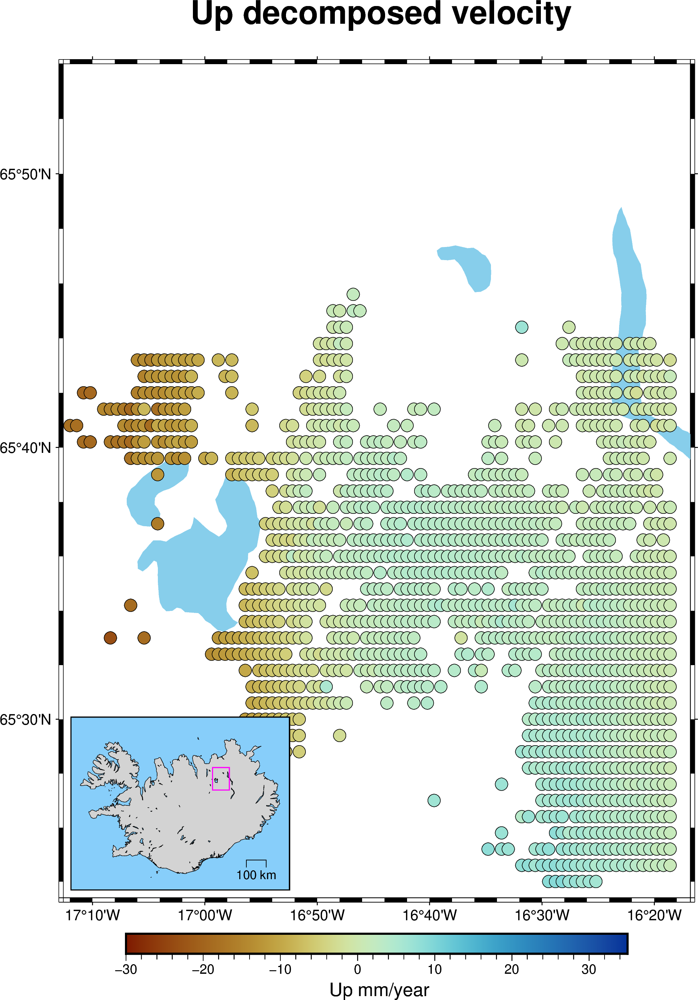

In [1155]:
region= [lon_min-0.01, lon_max+0.02, lat_min-0.01, lat_max]
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(shorelines="1/0.5p,black", water="skyblue")
pygmt.makecpt(cmap="roma", series=[-30, 35])

fig.plot(x= df_combined_velocities0_02_res['longitude'],y= df_combined_velocities0_02_res['latitude'], cmap=True, style="c0.3c", fill=df_combined_velocities0_02_res['dU'], pen="black", frame="+t Up decomposed velocity")
fig.colorbar(frame="xaf+l Up mm/year")


# Make the inset, indicating the region of interest, with all of its features
with fig.inset(position="jBL+w5.2c/4.1c+o0.2c/0.2c", box="+pblack"):
    fig.coast(
        region="-25/-13/63/67",
        projection="M?", borders=[1, 2],
        land="lightgray", water="lightskyblue",
        shorelines="0.2p,black", map_scale="n0.85/0.15+l+c127.7/34.95+w100"
    )

    rectangle = [[region[0], region[2], region[1], region[3]]]
    fig.plot(data=rectangle, style="r+s", pen="0.6p,#ff00fc")
#fig.savefig("presentation/up_from_residuals_0_02.png")

fig.show()

/var/folders/9f/qj38cd3d5v37nszw4dsn87nr0000gn/T/ipykernel_12827/3098169208.py:23: SyntaxWarning: Short-form parameter (T) is not recommended. Use long-form parameter 'tension' instead.
  surface_grid = pygmt.surface(


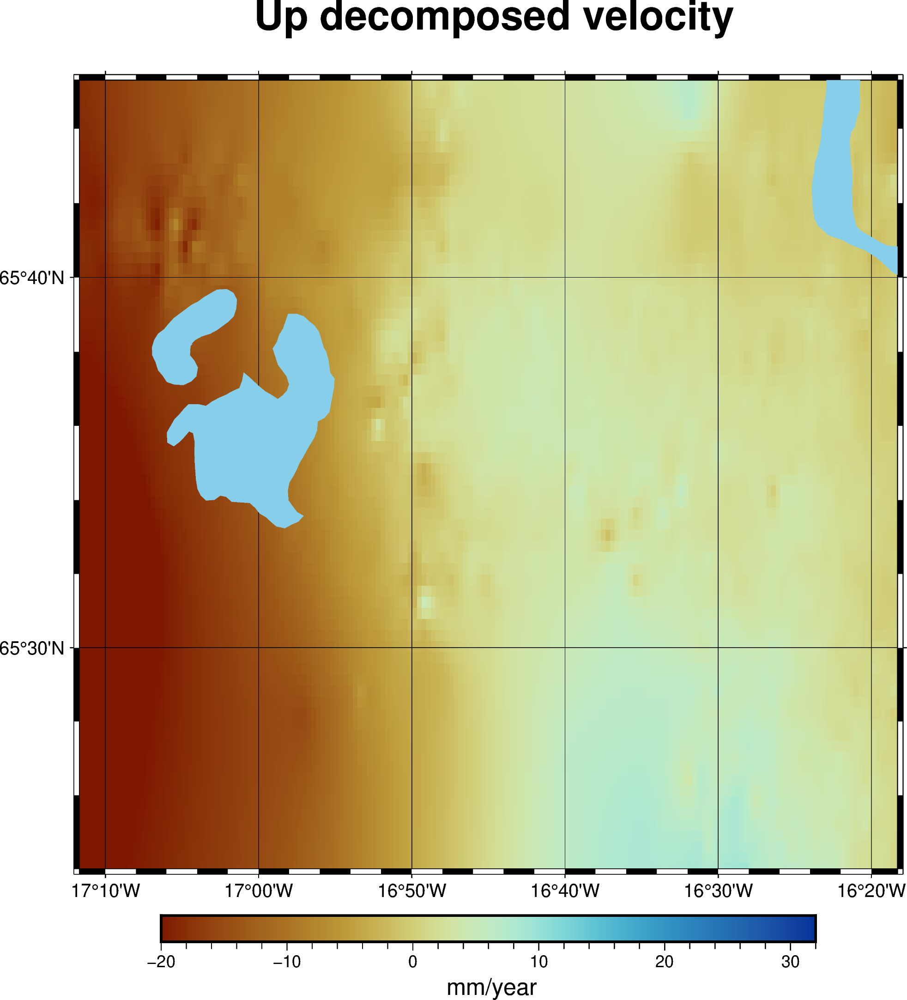

In [1162]:
fig = pygmt.Figure()


# Define the region based on your data
region = [
    df_combined_velocities0_005_res['longitude'].min(),
    df_combined_velocities0_005_res['longitude'].max() ,
    df_combined_velocities0_005_res['latitude'].min() ,
    df_combined_velocities0_005_res['latitude'].max()
]

# Create a temporary DataFrame to use with PyGMT blockmean and surface
temp_df = df_combined_velocities0_02_res[['longitude', 'latitude', 'dU']]

# Create a blockmean grid
blockmean_output = pygmt.blockmean(
    data=temp_df,
    region=region,
    spacing="0.005"
)

# Create a surface grid
surface_grid = pygmt.surface(
    data=blockmean_output,
    region=region,
    spacing="0.005",
    T=0.25  # Adjust Tension factor for smoother grid
)

# Start plotting
fig = pygmt.Figure()

# Set the color palette
pygmt.makecpt(cmap="roma", series=[-20, 32])

# Plot the surface grid
fig.grdimage(
    grid=surface_grid,
    region=region,
    projection="M15c",
    frame=["afg", "+t Up decomposed velocity"],
    cmap=True
)

# Add coastlines
fig.coast(
    shorelines="1/0.5p,black",
    water="skyblue"
)

# Add colorbar
fig.colorbar(frame="xaf+l mm/year")


# Show the figure
fig.savefig("presentation/up_decomposed_from_res_grid_0_02.png")
fig.show()